In [1]:
!nvidia-smi

Fri Mar  3 15:05:58 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 510.108.03   Driver Version: 510.108.03   CUDA Version: 11.6     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ...  Off  | 00000000:02:00.0  On |                  N/A |
|  0%   38C    P8    16W / 200W |    693MiB /  8192MiB |     17%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
!python3 -m pip install --upgrade setuptools pip

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


In [5]:
import glob
import shutil
import cv2
import os
import re
import numpy as np
from PIL import Image
from sklearn.model_selection import train_test_split as tts
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import random
import PIL

In [4]:
!pip install -U scikit-learn

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.8/9.8 MB 80.9 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 298.0/298.0 kB 349.6 MB/s eta 0:00:00


In [6]:
pwd

'/app'

In [7]:
ls /app/

Copy_of_YOloV5_.ipynb  annotations/  images/  yolov5s.pt
Untitled.ipynb         data/         yolov5/


In [15]:
cd /app

/app


In [16]:
ls 

 Copy_of_YOloV5_.ipynb   annotations/  'garbage classification'/   yolov5/
 Untitled.ipynb          data/          images/                    yolov5s.pt


In [6]:
base_dir = "/app/garbage classification/Garbage classification"
train_dir = os.path.join(base_dir, 'train')
train_img_dir = os.path.join(train_dir, 'images')
train_label_dir = os.path.join(train_dir, 'labels')

test_dir = os.path.join(base_dir, 'test')
test_img_dir = os.path.join(test_dir, 'images')
test_label_dir = os.path.join(test_dir, 'labels')


In [9]:
def create_dir(path):
    if not os.path.exists(path):
        os.mkdir(path)

In [30]:
import torch
import torchvision
from torch.utils.data import random_split
import torchvision.models as models
import torch.nn as nn
import torch.nn.functional as F

In [31]:
print(torch.__version__)

1.13.1+cu117


In [10]:
create_dir(train_dir)

In [11]:
create_dir(train_img_dir)
create_dir(train_label_dir)

In [12]:
create_dir(test_dir)
create_dir(test_img_dir)
create_dir(test_label_dir)

In [13]:
# visualize Classes
base_dir = "/app/garbage classification/Garbage classification"

classes = os.listdir(base_dir)

classes


['cardboard', 'test', 'metal', 'trash', 'train', 'glass', 'paper', 'plastic']

In [63]:
class_dirs = {name: os.path.join(base_dir, name) for name in classes}

In [24]:
def class_name(classes, base_dir):
    class_dirs = {name : os.path.join(base_dir, name) for name in classes}
    return class_dirs

In [25]:
class_name(classes, base_dir)

{'cardboard': '/app/garbage classification/Garbage classification/cardboard',
 'test': '/app/garbage classification/Garbage classification/test',
 'metal': '/app/garbage classification/Garbage classification/metal',
 'trash': '/app/garbage classification/Garbage classification/trash',
 'train': '/app/garbage classification/Garbage classification/train',
 'glass': '/app/garbage classification/Garbage classification/glass',
 'paper': '/app/garbage classification/Garbage classification/paper',
 'plastic': '/app/garbage classification/Garbage classification/plastic'}

In [64]:
class_dirs

{'cardboard': '/app/garbage classification/Garbage classification/cardboard',
 'test': '/app/garbage classification/Garbage classification/test',
 'metal': '/app/garbage classification/Garbage classification/metal',
 'trash': '/app/garbage classification/Garbage classification/trash',
 'train': '/app/garbage classification/Garbage classification/train',
 'glass': '/app/garbage classification/Garbage classification/glass',
 'paper': '/app/garbage classification/Garbage classification/paper',
 'plastic': '/app/garbage classification/Garbage classification/plastic'}

In [26]:
import os
import random
import shutil

dataset_dir = '/app/garbage classification/Garbage classification'
train_dir = '/app/garbage classification/Garbage classification/train'
test_dir = '/app/garbage classification/Garbage classification/test'

if not os.path.exists(train_dir):
    os.makedirs(train_dir)

if not os.path.exists(test_dir):
    os.makedirs(test_dir)

for class_name in os.listdir(dataset_dir):
    class_dir = os.path.join(dataset_dir, class_name)
    if not os.path.isdir(class_dir):
        continue

    train_class_dir = os.path.join(train_dir, class_name)
    if not os.path.exists(train_class_dir):
        os.makedirs(train_class_dir)

    test_class_dir = os.path.join(test_dir, class_name)
    if not os.path.exists(test_class_dir):
        os.makedirs(test_class_dir)

    file_list = os.listdir(class_dir)
    file_list = [file for file in file_list if file.endswith('.jpg') or file.endswith('.jpeg') or file.endswith('.png')]

    random.shuffle(file_list)
    train_files = file_list[:int(0.8*len(file_list))]
    test_files = file_list[int(0.8*len(file_list)):]

    for file in train_files:
        src_path = os.path.join(class_dir, file)
        dst_path = os.path.join(train_class_dir, file)
        shutil.move(src_path, dst_path)

    for file in test_files:
        src_path = os.path.join(class_dir, file)
        dst_path = os.path.join(test_class_dir, file)
        shutil.move(src_path, dst_path)


In [27]:

garbage_count=[]
garbage_class=[]
for i in os.listdir(base_dir+'/train'):
    garbage_class.append(i)
    garbage_count.append(len(os.listdir(os.path.join(base_dir+'/train', i))))
garbage_df = pd.DataFrame({'garbage_class':garbage_class, 'garbage_count':garbage_count})



In [28]:

garbage_count=[]
garbage_class=[]
for i in os.listdir(base_dir+'/test'):
    garbage_class.append(i)
    garbage_count.append(len(os.listdir(os.path.join(base_dir+'/test', i))))
garbage_df_2 = pd.DataFrame({'garbage_class':garbage_class, 'garbage_count':garbage_count})


In [29]:
garbage_df_2

,garbage_class,garbage_count
0,cardboard,81
1,images,0
2,metal,82
3,trash,28
4,labels,0
5,glass,101
6,paper,119
7,plastic,97


In [30]:
garbage_df

,garbage_class,garbage_count
0,cardboard,322
1,images,0
2,metal,328
3,trash,109
4,labels,0
5,glass,400
6,paper,475
7,plastic,385


In [24]:
garbage_count = []
garbage_class = []

for i in os.listdir(base_dir  + "/train"):
    garbage_class.append(i)
    garbage_count.append(len(os.listdir(os.path.join(base_dir + "/train", i))))
garbage_df = pd.DataFrame({'garbage_class':garbage_class, 'garbage_count':garbage_count})

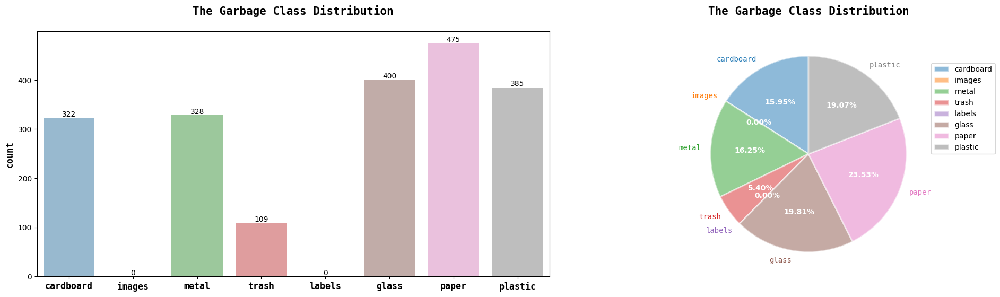

In [31]:
%matplotlib inline
fig,axes = plt.subplots(1,2,figsize=(25,6), gridspec_kw=dict(wspace=0.005))
sns.barplot(data=garbage_df, x='garbage_class', y='garbage_count',ax=axes[0], alpha=0.5)
for i in axes[0].get_xticklabels():
    i.set_font('monospace')
    i.set_weight('semibold')
    i.set_size(12)
for j in axes[0].containers:
    axes[0].bar_label(j)
    
axes[0].set_xlabel('')
axes[0].set_ylabel('count', font='monospace', weight='semibold', size=12)
axes[0].set_title('The Garbage Class Distribution\n', font='monospace', weight='semibold', size=15)

patches, texts, pcts = axes[1].pie(garbage_df['garbage_count'], labels=garbage_df['garbage_class'], wedgeprops={'linewidth': 2, 'edgecolor': 'white'},
            textprops={'size': 'x-large'}, startangle=90, autopct='%1.2f%%');
for i, patch in enumerate(patches):
    texts[i].set_color(patch.get_facecolor())
    patch.set_alpha(0.5)
for j in pcts:
    j.set_size(10)
    j.set_color('white')
    j.set_weight('semibold')
plt.setp(texts, fontweight='semibold', font='monospace')
axes[1].legend(loc=[1,0.5])
axes[1].set_title('The Garbage Class Distribution\n', font='monospace', weight='semibold', size=15);

In [45]:
def create_yolo_boundbox(img_path):
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    
    lower = np.array([20,20,20], dtype='uint8')
    upper = np.array([200,200,200],dtype='uint8')
    img = cv2.inRange(image, lower, upper)
    
    
    img = cv2.blur(img, (2,2))
    ret, thres = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY)
    img = cv2.bitwise_not(thres)
    contours, hierarchy = cv2.findContours(img,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
    contours = max(contours, key=lambda x: cv2.contourArea(x))
    
    # get bounding box coordinates
    xmin, ymin, xmax, ymax = cv2.boundingRect( contours)
    dimensions = img.shape
    h = img.shape[0]
    w = img.shape[1]
    
    # to calculate bndBox info for yolov5
    xp = (xmin + (xmax-xmin)/2) * 1.0 /w
    yp = (ymin + (ymax- ymin )/2 ) *1.0 /h
    wp = (xmax - xmin) * 1.0 / w
    hp = (ymax - ymin ) *1.0 / h
    
    return xp, yp, wp, hp
    
    

In [46]:
dataset_dir = dataset_dir

In [50]:
glob.glob(dataset_dir)

['/app/garbage classification/Garbage classification']

In [49]:
pwd

'/app'

In [51]:
train_img_dir

'/app/garbage classification/Garbage classification/train/images'

In [53]:
test_img_dir, train_label_dir,

('/app/garbage classification/Garbage classification/test/images',
 '/app/garbage classification/Garbage classification/train/labels')

In [59]:
for dirname, _, filenames in os.walk(dataset_dir):
    if dirname[1:].split('/')[-2]=='train':
        for img_path in glob.glob(dirname+'/*.jpg'):
            shutil.copy(img_path, os.path.join(train_dir, img_path.split('/')[-1]))

            label = 0
            if img_path.split('/')[-2] == 'cardboard':
                label=0
            elif img_path.split('/')[-2] == 'glass':
                label=1
            elif img_path.split('/')[-2] == 'metal':
                label=2
            elif img_path.split('/')[-2] == 'paper':
                label=3
            elif img_path.split('/')[-2] == 'plastic':
                label=4
            elif img_path.split('/')[-2] == 'trash':
                label=5
            x_center, y_center, box_width, box_height = create_yolo_boundbox(img_path)
            text = str(label)+' '+str(x_center)+' '+str(y_center)+' '+str(box_width)+' '+str(box_height)
            with open (os.path.join(train_label_dir, img_path.split('/')[-1][:-4]+'.txt'),'w') as file:
                file.write(text)

    if dirname[1:].split('/')[-2]=='test':
        for img_path in glob.glob(dirname+'/*.jpg'):
            shutil.copy(img_path, os.path.join(test_dir, img_path.split('/')[-1]))

            label = 0
            if img_path.split('/')[-2] == 'cardboard':
                label=0
            elif img_path.split('/')[-2] == 'glass':
                label=1
            elif img_path.split('/')[-2] == 'metal':
                label=2
            elif img_path.split('/')[-2] == 'paper':
                label=3
            elif img_path.split('/')[-2] == 'plastic':
                label=4
            elif img_path.split('/')[-2] == 'trash':
                label=5
            x_center, y_center, box_width, box_height = create_yolo_boundbox(img_path)
            text = str(label)+' '+str(x_center)+' '+str(y_center)+' '+str(box_width)+' '+str(box_height)
            with open (os.path.join(test_label_dir, img_path.split('/')[-1][:-4]+'.txt'),'w') as file:
                file.write(text)


In [110]:
test_img_dir

'/app/garbage classification/Garbage classification/test/images'

In [60]:


print(f'There are {len(os.listdir(train_img_dir))} train images')
print(f'There are {len(os.listdir(train_label_dir))} corresponding train labels\n')

print(f'There are {len(os.listdir(test_img_dir))} train images')
print(f'There are {len(os.listdir(test_label_dir))} corresponding test labels')



There are 2019 train images
There are 2019 corresponding train labels

There are 508 train images
There are 508 corresponding test labels


In [63]:
img = []
selected_img = random.sample([i for i in os.listdir(train_img_dir)], 10)
for i in selected_img:
    img.append(os.path.join(train_img_dir, i))


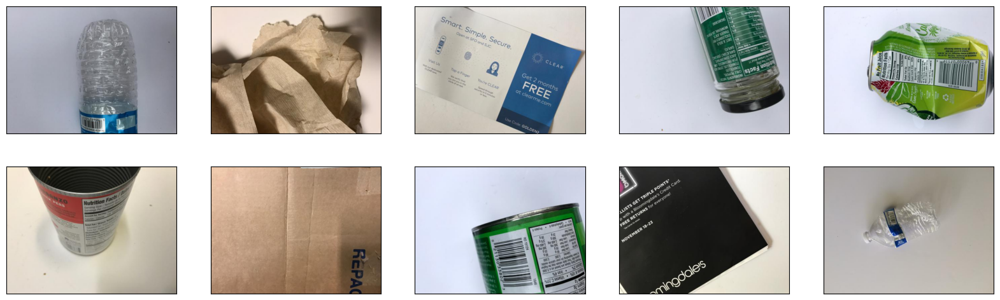

In [64]:
fig, axes = plt.subplots(2,5, figsize=(20,6), subplot_kw=dict(xticks=[], yticks=[]))
for i, ax in enumerate(axes.flat):
    ax.imshow(np.array(PIL.Image.open(img[i])))


In [73]:
yaml_file = """names:
- cardboard
- glass
- metal
- paper
- plastic
- trash
nc: 6
train: /app/garbage classification/Garbage classification/train/images
val: /app/garbage classification/Garbage classification/test/images

"""

with open('/app/data.yaml', 'w') as f:
    f.write(yaml_file)

In [74]:
sign_data = '/app/data.yaml'

In [102]:
epochs=15
sign_data=sign_data
!python yolov5/train.py --img 640 --batch 16 --epochs {epochs} --data {sign_data} --weights yolov5s.pt

train: weights=yolov5s.pt, cfg=, data=/app/data.yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=15, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolov5/runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: ⚠️ YOLOv5 is out of date by 8 commits. Use `git pull` or `git clone https://github.com/ultralytics/yolov5` to update.
YOLOv5 🚀 v7.0-108-g4db6757 Python-3.8.10 torch-1.13.1+cu117 CUDA:0 (NVIDIA GeForce RTX 3060 Ti, 7974MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0,

In [85]:
os.listdir('yolov5/runs/train/exp2')

['val_batch1_pred.jpg',
 'opt.yaml',
 'hyp.yaml',
 'weights',
 'val_batch0_labels.jpg',
 'val_batch0_pred.jpg',
 'F1_curve.png',
 'PR_curve.png',
 'train_batch0.jpg',
 'labels.jpg',
 'val_batch1_labels.jpg',
 'P_curve.png',
 'results.png',
 'val_batch2_labels.jpg',
 'labels_correlogram.jpg',
 'confusion_matrix.png',
 'R_curve.png',
 'train_batch2.jpg',
 'events.out.tfevents.1677860449.ecf422d3be30.267.0',
 'results.csv',
 'val_batch2_pred.jpg',
 'train_batch1.jpg']

In [79]:
!tensorboard --logdir /app/yolov5/runs/train

2023-03-03 16:40:09.689817: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-03-03 16:40:12.298894: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/lib/python3.8/dist-packages/cv2/../../lib64:/usr/local/cuda-11.0/targets/x86_64-linux/lib:/usr/local/cuda/extras/CUPTI/lib64:/usr/local/cuda/lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-03-03 16:40:12.298967: I tensorflow/compiler/xla/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2023-03-03 16:40:24.86

In [81]:
!tensorboard --logdir /app/yolov5/runs/train --load_fast true

2023-03-03 16:43:32.934826: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-03-03 16:43:33.020038: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/lib/python3.8/dist-packages/cv2/../../lib64:/usr/local/cuda-11.0/targets/x86_64-linux/lib:/usr/local/cuda/extras/CUPTI/lib64:/usr/local/cuda/lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-03-03 16:43:33.020057: I tensorflow/compiler/xla/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2023-03-03 16:43:34.16

In [82]:
!pip install tensorboard

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


In [105]:
exp_path2 = 'yolov5/runs/train/exp3'

In [89]:
import matplotlib.pyplot as plt
from PIL import Image

In [91]:
exp_path = 'yolov5/runs/train/exp2'

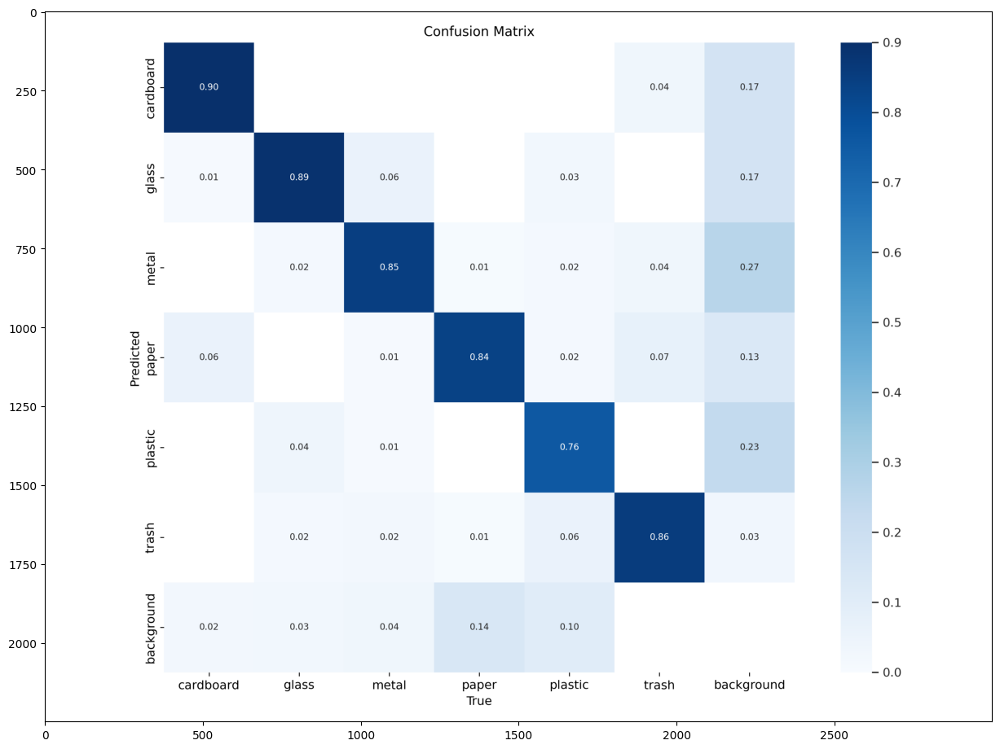

In [92]:
img_path = exp_path + '/confusion_matrix.png'
img = Image.open(img_path)
plt.figure(figsize=(15, 15))
plt.imshow(img)



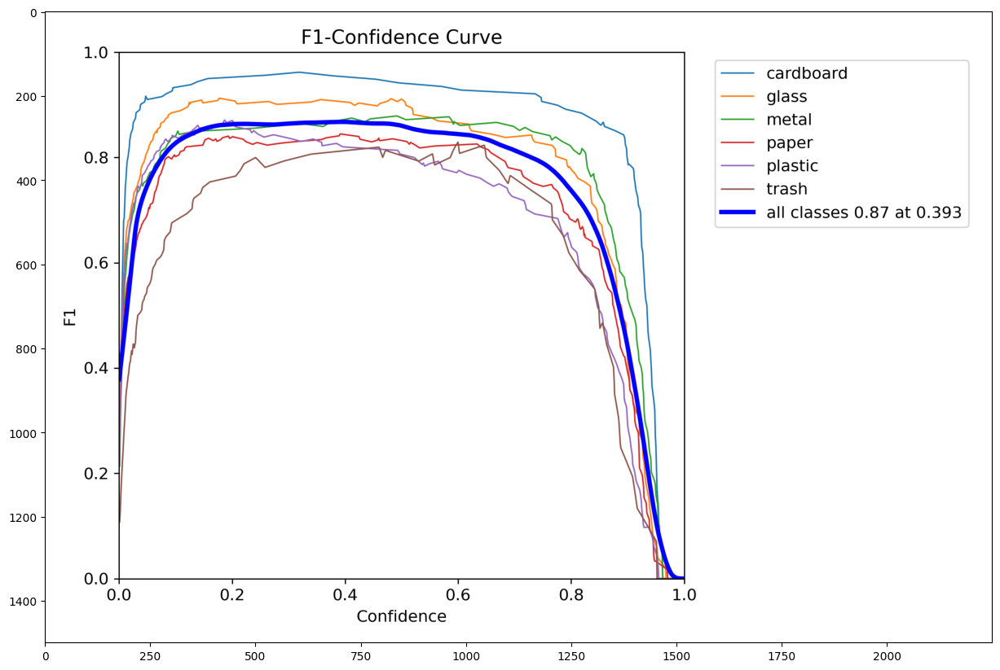

In [93]:


img_path = exp_path + '/F1_curve.png'
img = Image.open(img_path)
plt.figure(figsize=(15, 15))
plt.imshow(img)

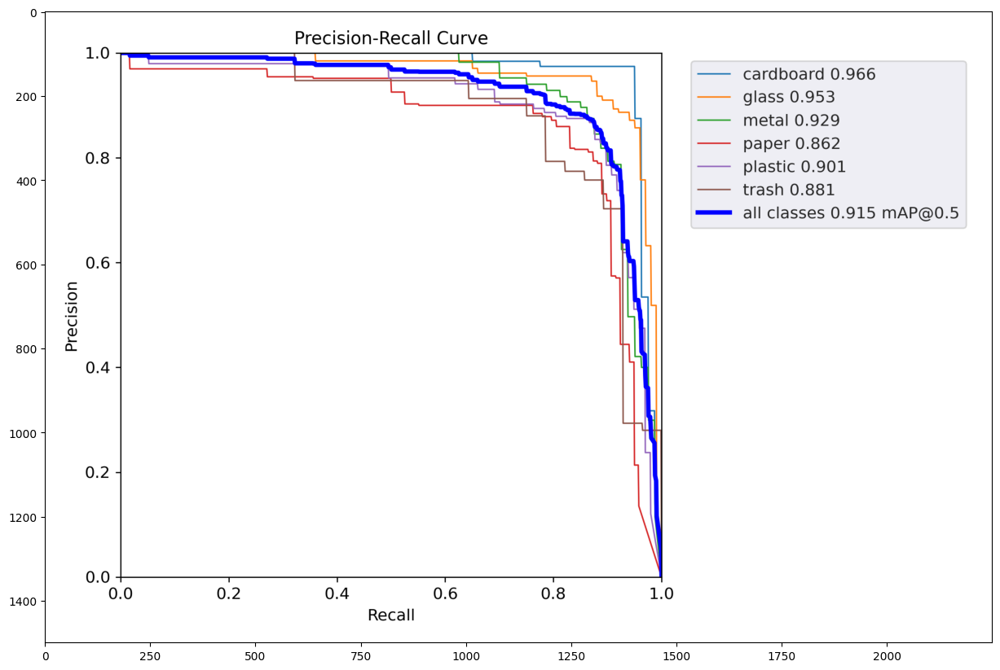

In [95]:

img_path = exp_path + '/PR_curve.png'
img = Image.open(img_path)
plt.figure(figsize=(15, 15))
plt.imshow(img)

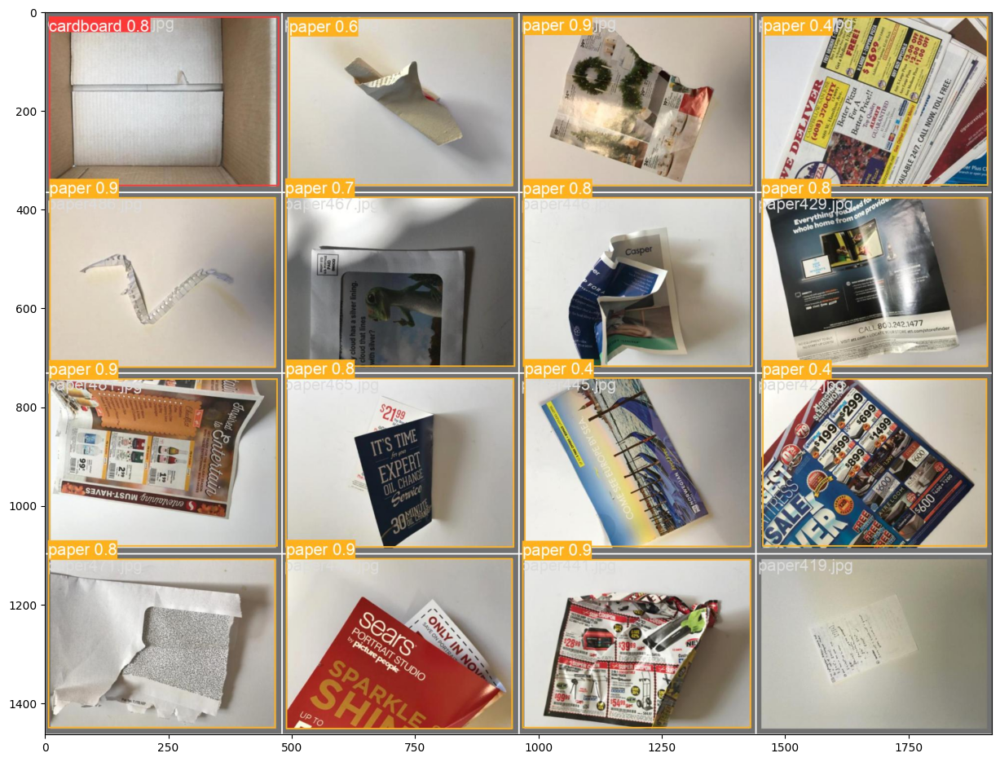

In [96]:

img_path = exp_path + '/val_batch0_pred.jpg'
img = Image.open(img_path)
plt.figure(figsize=(15, 15))
plt.imshow(img)

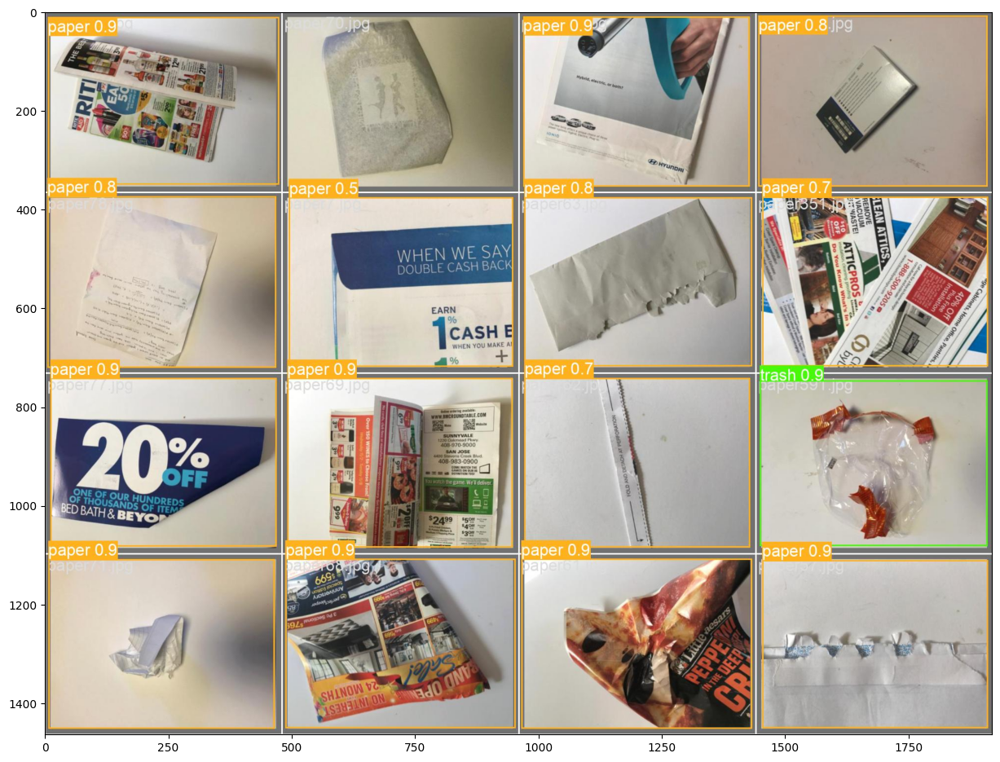

In [97]:

img_path = exp_path + '/val_batch1_pred.jpg'
img = Image.open(img_path)
plt.figure(figsize=(15, 15))
plt.imshow(img)

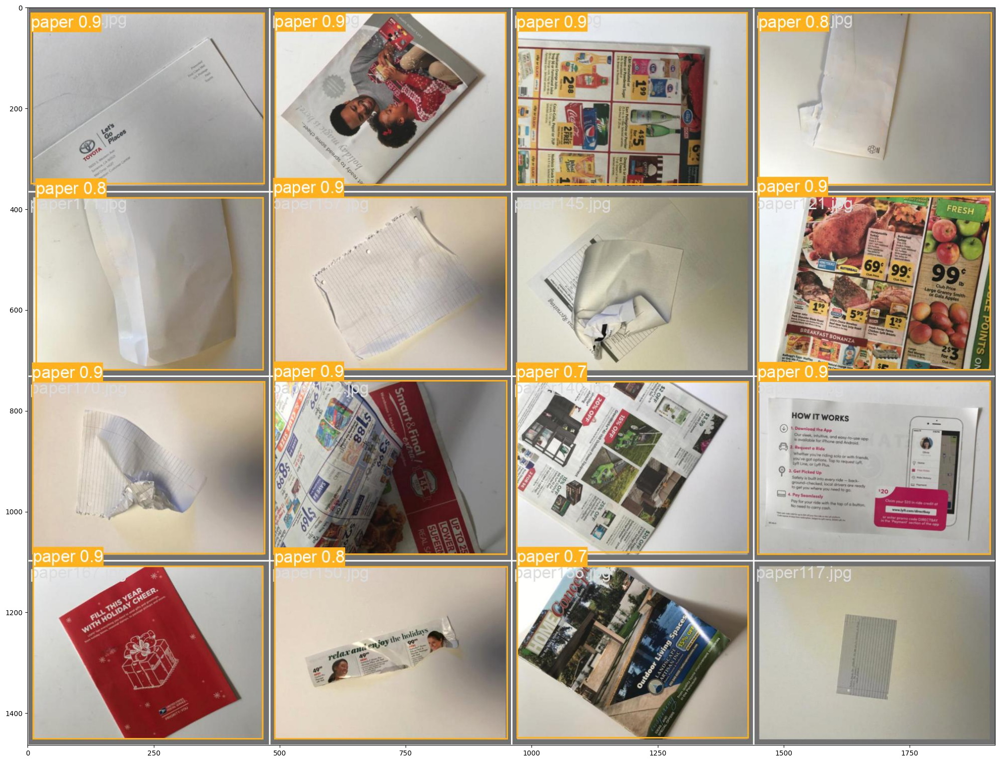

In [100]:

img_path = exp_path + '/val_batch2_pred.jpg'
img = Image.open(img_path)
plt.figure(figsize=(25, 25))
plt.imshow(img)

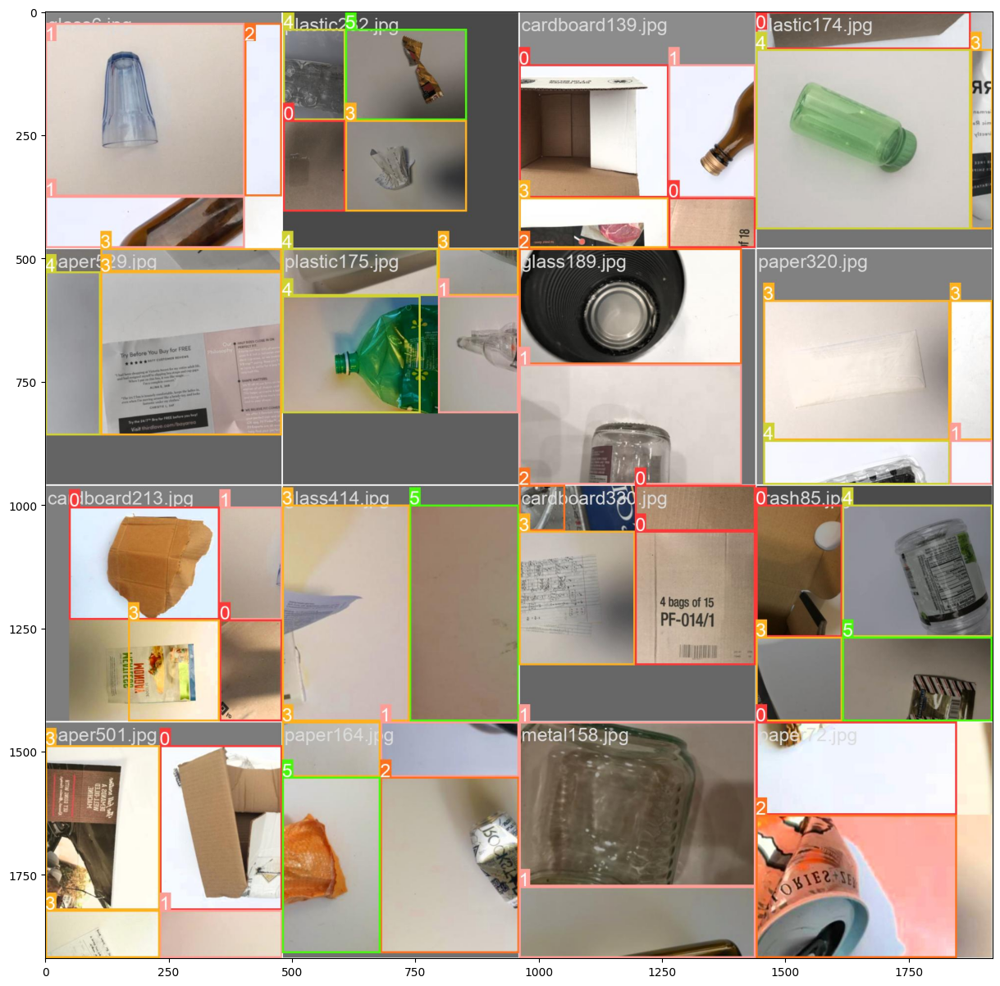

In [101]:

img_path = exp_path + '/train_batch0.jpg'
img = Image.open(img_path)
plt.figure(figsize=(15, 15))
plt.imshow(img)

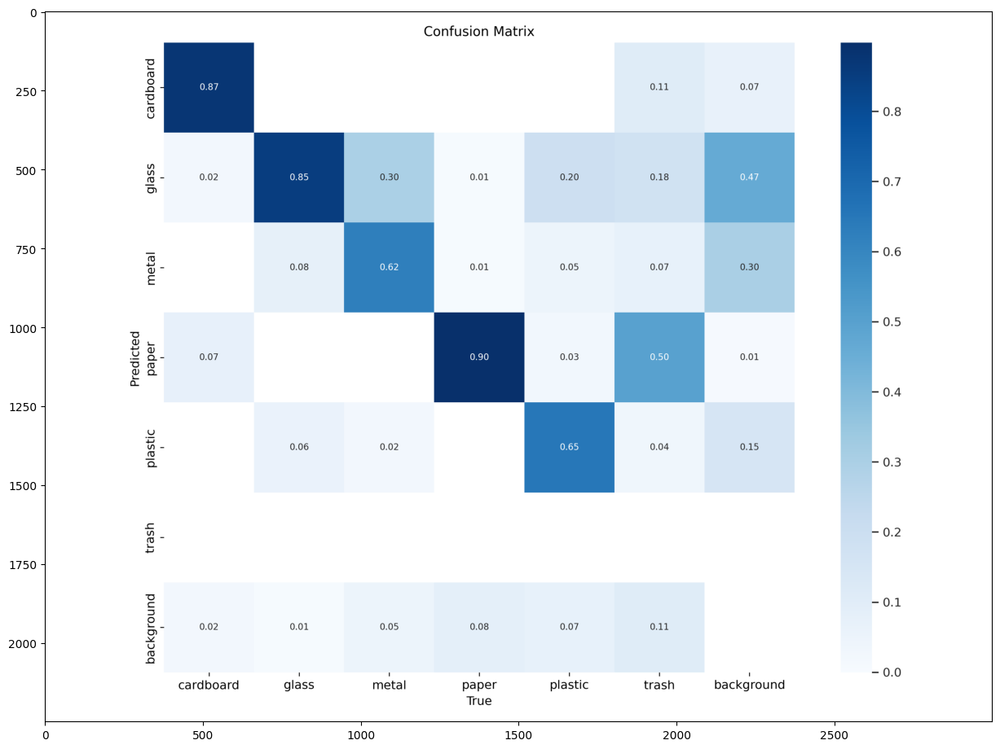

In [106]:
img_path = exp_path2 + '/confusion_matrix.png'
img = Image.open(img_path)
plt.figure(figsize=(15, 15))
plt.imshow(img)


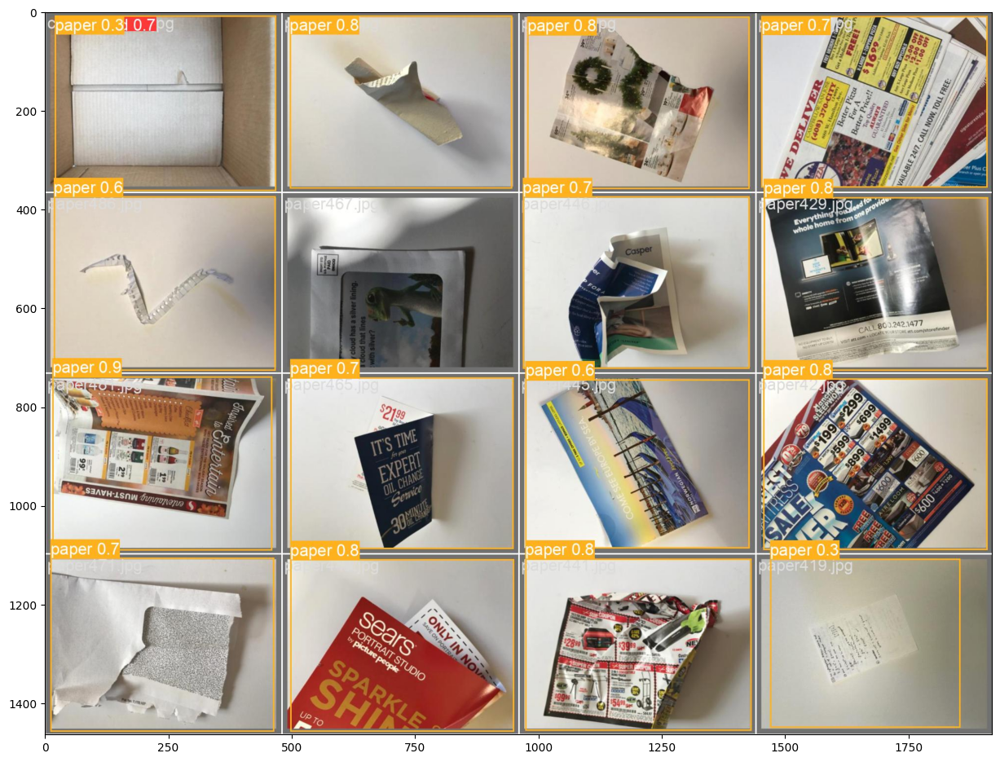

In [107]:
img_path = exp_path2 + '/val_batch0_pred.jpg'
img = Image.open(img_path)
plt.figure(figsize=(15, 15))
plt.imshow(img)


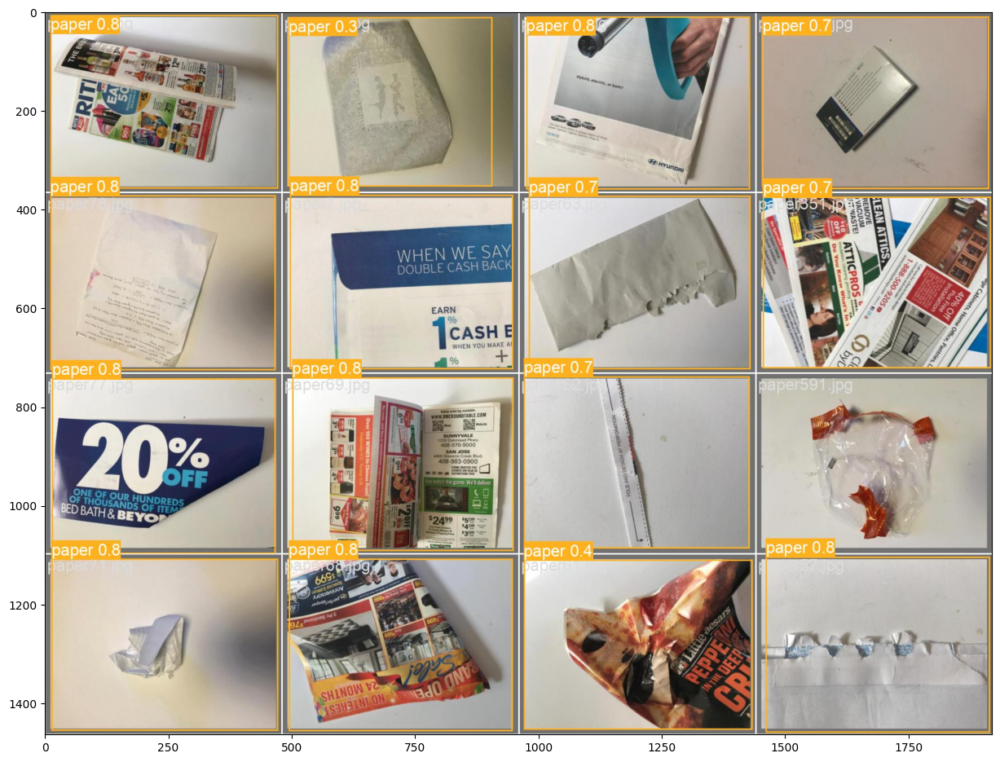

In [108]:
img_path = exp_path2 + '/val_batch1_pred.jpg'
img = Image.open(img_path)
plt.figure(figsize=(15, 15))
plt.imshow(img)


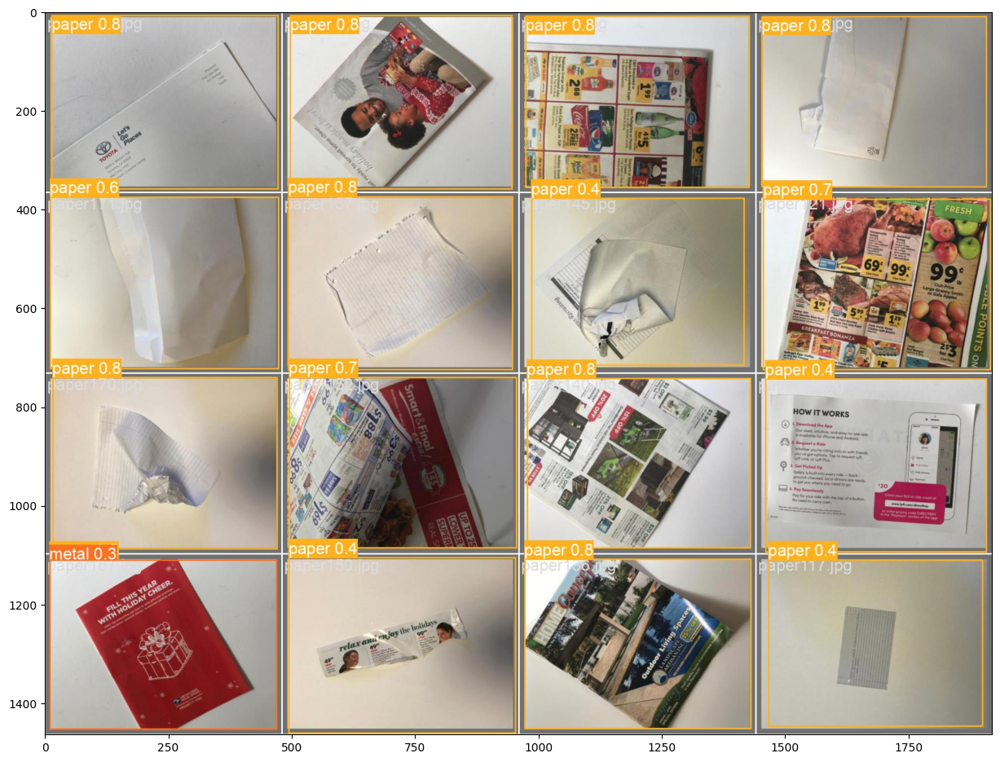

In [109]:
img_path = exp_path2 + '/val_batch2_pred.jpg'
img = Image.open(img_path)
plt.figure(figsize=(15, 15))
plt.imshow(img)


In [ ]:
weights_best = '/app/yolov5/runs/train/exp2/weights/best.pt'

'/app/garbage classification/Garbage classification/test/images'

In [114]:
!python yolov5/detect.py --source '/app/garbage classification/Garbage classification/test/images' --weights '/app/yolov5/runs/train/exp2/weights/best.pt' --conf 0.25 --name yolo_road_det

detect: weights=['/app/yolov5/runs/train/exp2/weights/best.pt'], source=/app/garbage classification/Garbage classification/test/images, data=yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=yolo_road_det, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-108-g4db6757 Python-3.8.10 torch-1.13.1+cu117 CUDA:0 (NVIDIA GeForce RTX 3060 Ti, 7974MiB)

Fusing layers... 
Model summary: 157 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs
image 1/508 /app/garbage classification/Garbage classification/test/images/cardboard102.jpg: 480x640 1 cardboard, 39.3ms
image 2/508 /app/garbage classification/Garbage classification/test/images/cardboard110.jpg: 480x640 1 cardboard, 15.1ms
image 3

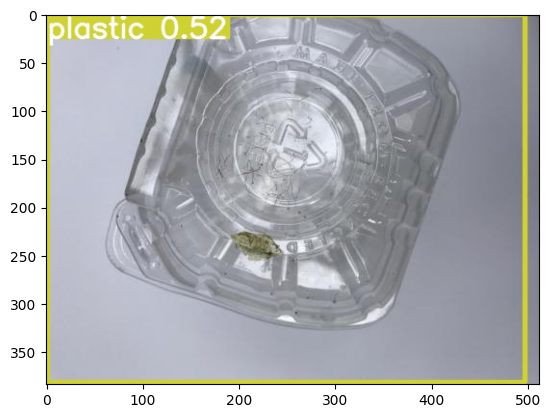

In [139]:
detections_dir = "yolov5/runs/detect/yolo_road_det2"
detection_images = [os.path.join(detections_dir, x) for x in os.listdir(detections_dir)]

random_detection_image = Image.open(random.choice(detection_images))
plt.imshow(np.array(random_detection_image))